In [50]:
pip install folium

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import radians, sin, cos, sqrt, atan2
import warnings
import folium

warnings.filterwarnings("ignore")

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import KNNImputer

from sklearn.model_selection import train_test_split


In [52]:
df = pd.read_csv(r"C:\Users\user\Downloads\finalTrain.csv")

In [53]:
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weather_conditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min)
0,0xcdcd,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,12-02-2022,21:55,22:10,Fog,Jam,2,Snack,motorcycle,3.0,No,Metropolitian,46
1,0xd987,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,13-02-2022,14:55,15:05,Stormy,High,1,Meal,motorcycle,1.0,No,Metropolitian,23
2,0x2784,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,04-03-2022,17:30,17:40,Sandstorms,Medium,1,Drinks,scooter,1.0,No,Metropolitian,21
3,0xc8b6,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,13-02-2022,09:20,09:30,Sandstorms,Low,0,Buffet,motorcycle,0.0,No,Metropolitian,20
4,0xdb64,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,14-02-2022,19:50,20:05,Fog,Jam,1,Snack,scooter,1.0,No,Metropolitian,41


In [54]:
df.shape

(45584, 20)

In [55]:
df.columns

Index(['ID', 'Delivery_person_ID', 'Delivery_person_Age',
       'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Order_Date', 'Time_Orderd',
       'Time_Order_picked', 'Weather_conditions', 'Road_traffic_density',
       'Vehicle_condition', 'Type_of_order', 'Type_of_vehicle',
       'multiple_deliveries', 'Festival', 'City', 'Time_taken (min)'],
      dtype='object')

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45584 entries, 0 to 45583
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45584 non-null  object 
 1   Delivery_person_ID           45584 non-null  object 
 2   Delivery_person_Age          43730 non-null  float64
 3   Delivery_person_Ratings      43676 non-null  float64
 4   Restaurant_latitude          45584 non-null  float64
 5   Restaurant_longitude         45584 non-null  float64
 6   Delivery_location_latitude   45584 non-null  float64
 7   Delivery_location_longitude  45584 non-null  float64
 8   Order_Date                   45584 non-null  object 
 9   Time_Orderd                  43853 non-null  object 
 10  Time_Order_picked            45584 non-null  object 
 11  Weather_conditions           44968 non-null  object 
 12  Road_traffic_density         44983 non-null  object 
 13  Vehicle_conditio

In [57]:
df.isnull().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age            1854
Delivery_person_Ratings        1908
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    1731
Time_Order_picked                 0
Weather_conditions              616
Road_traffic_density            601
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             993
Festival                        228
City                           1200
Time_taken (min)                  0
dtype: int64

In [58]:
df.describe()

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Vehicle_condition,multiple_deliveries,Time_taken (min)
count,43730.000000,43676.000000,45584.000000,45584.000000,45584.000000,45584.000000,45584.000000,44591.000000,45584.000000
mean,29.566911,4.633774,17.017948,70.229684,17.465480,70.844161,1.023385,0.744635,26.293963
std,5.815064,0.334744,8.185674,22.885575,7.335562,21.120578,0.839055,0.572510,9.384298
min,15.000000,1.000000,-30.905562,-88.366217,0.010000,0.010000,0.000000,0.000000,10.000000
25%,25.000000,4.500000,12.933284,73.170000,12.988453,73.280000,0.000000,0.000000,19.000000
50%,30.000000,4.700000,18.551440,75.897963,18.633934,76.002574,1.000000,1.000000,26.000000
75%,35.000000,4.900000,22.728163,78.044095,22.785049,78.107044,2.000000,1.000000,32.000000
max,50.000000,6.000000,30.914057,88.433452,31.054057,88.563452,3.000000,3.000000,54.000000


In [59]:
for i in df.columns:
    print(f" no. of unique value in {i} is : {df[i].nunique()}")
    print("##################################################")
    if (df[i].nunique()) < 8:
        print(f" unique value are : {df[i].unique()}")
        print("*************************************")
    else:
              pass

 no. of unique value in ID is : 45584
##################################################
 no. of unique value in Delivery_person_ID is : 1320
##################################################
 no. of unique value in Delivery_person_Age is : 22
##################################################
 no. of unique value in Delivery_person_Ratings is : 28
##################################################
 no. of unique value in Restaurant_latitude is : 657
##################################################
 no. of unique value in Restaurant_longitude is : 518
##################################################
 no. of unique value in Delivery_location_latitude is : 4373
##################################################
 no. of unique value in Delivery_location_longitude is : 4373
##################################################
 no. of unique value in Order_Date is : 44
##################################################
 no. of unique value in Time_Orderd is : 176
########################

In [60]:
feature = []
dtypes = []
count = []
unique = []
missing = []
missing_percentage = []

for column in df.columns:
    feature.append(column)
    count.append(len(df[column]))
    missing.append(df[column].isnull().sum())
    unique.append(df[column].nunique())
    missing_percentage.append((df[column].isnull().sum() / df.shape[0]) * 100)
    dtypes.append(df[column].dtypes)

dataframe = pd.DataFrame({'feature': feature,
                         'count': count,
                         'missing': missing,
                         'nunique': unique,
                         'missing_percentage': missing_percentage,
                          'dtypes': dtypes
                         })
dataframe.set_index('feature')

,count,missing,nunique,missing_percentage,dtypes
feature,,,,,
ID,45584,0,45584,0.000000,object
Delivery_person_ID,45584,0,1320,0.000000,object
Delivery_person_Age,45584,1854,22,4.067217,float64
Delivery_person_Ratings,45584,1908,28,4.185679,float64
Restaurant_latitude,45584,0,657,0.000000,float64
Restaurant_longitude,45584,0,518,0.000000,float64
Delivery_location_latitude,45584,0,4373,0.000000,float64
Delivery_location_longitude,45584,0,4373,0.000000,float64
Order_Date,45584,0,44,0.000000,object


In [61]:
df.drop('ID', axis=1, inplace=True) 
#dropping the id 

In [62]:
df['Order_Date'].head()
#chatgpt

0    12-02-2022
1    13-02-2022
2    04-03-2022
3    13-02-2022
4    14-02-2022
Name: Order_Date, dtype: object

In [63]:
df['Order_Date'] = pd.to_datetime(df['Order_Date'], format='%d-%m-%Y', errors='coerce')
#chatgpt

In [64]:
df['Order_Date'].head()
df.info()
#chatgpt

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45584 entries, 0 to 45583
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Delivery_person_ID           45584 non-null  object        
 1   Delivery_person_Age          43730 non-null  float64       
 2   Delivery_person_Ratings      43676 non-null  float64       
 3   Restaurant_latitude          45584 non-null  float64       
 4   Restaurant_longitude         45584 non-null  float64       
 5   Delivery_location_latitude   45584 non-null  float64       
 6   Delivery_location_longitude  45584 non-null  float64       
 7   Order_Date                   45584 non-null  datetime64[ns]
 8   Time_Orderd                  43853 non-null  object        
 9   Time_Order_picked            45584 non-null  object        
 10  Weather_conditions           44968 non-null  object        
 11  Road_traffic_density         44983 non-nu

In [65]:
df['Order_Date'] = pd.to_datetime(df['Order_Date'])
df['Order_Date']

0       2022-02-12
1       2022-02-13
2       2022-03-04
3       2022-02-13
4       2022-02-14
           ...    
45579   2022-03-24
45580   2022-02-16
45581   2022-03-11
45582   2022-03-07
45583   2022-03-02
Name: Order_Date, Length: 45584, dtype: datetime64[ns]

In [66]:

df['year'] = df['Order_Date'].dt.year
df['month'] = df['Order_Date'].dt.month
df['day'] = df['Order_Date'].dt.day

In [67]:
df.head()

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,...,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min),year,month,day
0,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,2022-02-12,21:55,22:10,...,2,Snack,motorcycle,3.0,No,Metropolitian,46,2022,2,12
1,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,2022-02-13,14:55,15:05,...,1,Meal,motorcycle,1.0,No,Metropolitian,23,2022,2,13
2,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,2022-03-04,17:30,17:40,...,1,Drinks,scooter,1.0,No,Metropolitian,21,2022,3,4
3,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,2022-02-13,09:20,09:30,...,0,Buffet,motorcycle,0.0,No,Metropolitian,20,2022,2,13
4,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,2022-02-14,19:50,20:05,...,1,Snack,scooter,1.0,No,Metropolitian,41,2022,2,14


In [68]:
df.drop('Order_Date', axis=1, inplace=True)

In [69]:
df.dropna(subset=['Time_Orderd'], inplace=True)
df['Time_Orderd'] = df['Time_Orderd'].str.replace('.',':')
df['Time_Orderd'].sample(10)

12908    19:55
43470    20:25
44245    22:10
14621    16:25
45105    17:15
9104     08:35
25255    17:25
14047    22:15
33745    12:45
8513     20:45
Name: Time_Orderd, dtype: object

In [70]:
def extract_time(x):
    try:
        return x.split(':')[0] + x.split(':')[1][:2]
    except IndexError:
        return '00:00'

df['Time_Orderd'] = df['Time_Orderd'].apply(extract_time)

In [71]:
df['Time_Orderd'] = pd.to_datetime(df['Time_Orderd'], format= '%H:%M:%S', errors='ignore')

In [72]:
df['TimeOrder_Hour'] = df['Time_Orderd'].str.split(':', expand=True)[0]
df['TimeOrder_Hour'] = df['TimeOrder_Hour'].replace('0','00')
df['TimeOrder_Hour'] = df['TimeOrder_Hour'].astype('int32')

In [73]:
df['TimeOrder_min'] = pd.to_numeric(df['TimeOrder_min'], errors='coerce').fillna(0).astype('int32')
#chatgpt

KeyError: 'TimeOrder_min'

In [74]:
#df['TimeOrder_min'] = df['Time_Orderd'].str.split(':', expand=True)[1]
#df['TimeOrder_min'] = df['TimeOrder_min'].astype('int32')

In [75]:
df.columns

Index(['Delivery_person_ID', 'Delivery_person_Age', 'Delivery_person_Ratings',
       'Restaurant_latitude', 'Restaurant_longitude',
       'Delivery_location_latitude', 'Delivery_location_longitude',
       'Time_Orderd', 'Time_Order_picked', 'Weather_conditions',
       'Road_traffic_density', 'Vehicle_condition', 'Type_of_order',
       'Type_of_vehicle', 'multiple_deliveries', 'Festival', 'City',
       'Time_taken (min)', 'year', 'month', 'day', 'TimeOrder_Hour'],
      dtype='object')

In [76]:
df.head()

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_Orderd,Time_Order_picked,Weather_conditions,...,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken (min),year,month,day,TimeOrder_Hour
0,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,2155,22:10,Fog,...,Snack,motorcycle,3.0,No,Metropolitian,46,2022,2,12,2155
1,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,1455,15:05,Stormy,...,Meal,motorcycle,1.0,No,Metropolitian,23,2022,2,13,1455
2,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,1730,17:40,Sandstorms,...,Drinks,scooter,1.0,No,Metropolitian,21,2022,3,4,1730
3,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,0920,09:30,Sandstorms,...,Buffet,motorcycle,0.0,No,Metropolitian,20,2022,2,13,920
4,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,1950,20:05,Fog,...,Snack,scooter,1.0,No,Metropolitian,41,2022,2,14,1950


## TIME_ORDER_PICKED

In [77]:

df['Time_Order_picked'] = df['Time_Order_picked'].str.replace('.',':')

def extract_time(x):
    try:
        return x.split(':')[0] + ':' + x.split(':')[1][:2]
    except IndexError:
        return '00:00'

df['Time_Order_picked'] = df['Time_Order_picked'].apply(extract_time)

df['Time_Order_picked'] = pd.to_datetime(df['Time_Order_picked'], format= '%H:%M:%S', errors='ignore')

df['Time_Order_picked_Hour'] = df['Time_Order_picked'].str.split(':', expand=True)[0]
df['Time_Order_picked_Hour'] = df['Time_Order_picked_Hour'].astype('int32')

df['Time_Order_picked_min'] = df['Time_Order_picked'].str.split(':', expand=True)[1]
df['Time_Order_picked_min'] = df['Time_Order_picked_min'].astype('int32')

## extracting city from delivery_person_id

In [78]:

df['Delivery_city'] = df['Delivery_person_ID'].str.split('RES', expand=True)[0]
df.head()

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_Orderd,Time_Order_picked,Weather_conditions,...,Festival,City,Time_taken (min),year,month,day,TimeOrder_Hour,Time_Order_picked_Hour,Time_Order_picked_min,Delivery_city
0,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,2155,22:10,Fog,...,No,Metropolitian,46,2022,2,12,2155,22,10,DEH
1,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,1455,15:05,Stormy,...,No,Metropolitian,23,2022,2,13,1455,15,5,KOC
2,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,1730,17:40,Sandstorms,...,No,Metropolitian,21,2022,3,4,1730,17,40,PUNE
3,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,0920,09:30,Sandstorms,...,No,Metropolitian,20,2022,2,13,920,9,30,LUDH
4,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,1950,20:05,Fog,...,No,Metropolitian,41,2022,2,14,1950,20,5,KNP


In [79]:
df['Delivery_city'].unique()

array(['DEH', 'KOC', 'PUNE', 'LUDH', 'KNP', 'MUM', 'MYS', 'HYD', 'KOL',
       'RANCHI', 'COIMB', 'CHEN', 'JAP', 'SUR', 'BANG', 'GOA', 'AURG',
       'AGR', 'VAD', 'ALH', 'BHP', 'INDO'], dtype=object)

In [80]:
df.columns

Index(['Delivery_person_ID', 'Delivery_person_Age', 'Delivery_person_Ratings',
       'Restaurant_latitude', 'Restaurant_longitude',
       'Delivery_location_latitude', 'Delivery_location_longitude',
       'Time_Orderd', 'Time_Order_picked', 'Weather_conditions',
       'Road_traffic_density', 'Vehicle_condition', 'Type_of_order',
       'Type_of_vehicle', 'multiple_deliveries', 'Festival', 'City',
       'Time_taken (min)', 'year', 'month', 'day', 'TimeOrder_Hour',
       'Time_Order_picked_Hour', 'Time_Order_picked_min', 'Delivery_city'],
      dtype='object')

In [81]:
df['Restaurant_latitude'].dtypes

dtype('float64')

In [82]:
df['Delivery_person_Ratings'].isnull().sum()

np.int64(268)

## Filling the null value with the mean of that person id

In [83]:
rating_map = round(df.groupby('Delivery_person_ID')['Delivery_person_Ratings'].mean(),1).to_dict()
df['Delivery_person_Ratings'] = df['Delivery_person_Ratings'].fillna(df['Delivery_person_ID'].map(rating_map))

In [84]:
df['Delivery_person_Ratings'].isnull().sum()

np.int64(0)

## working with map

In [85]:
folium.Map (tiles="cartodb positron")

### Latitude and longitude

In [86]:
import plotly.express as px
data1 = df.copy()
data1.dropna(axis=0, how='any', inplace=True)
color_scale = [(0, 'orange'), (1,'red')]
fig = px.scatter_mapbox(data1, lat="Restaurant_latitude", lon= "Restaurant_longitude", color_continuous_scale= color_scale, zoom=8, height=1000, width=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0, "t":0,"l":0, "b":0})
fig.show()


In [87]:
"""
abs() function return the absolute vlaue. the absolute value of any number is always positive it remove the negative sign of a number in python
"""
df['Restaurant_latitude'] = df['Restaurant_latitude'].abs()

### to calculate the distance between two point on a sphere (such as Earth), we can use the Haversine formula

In [88]:
import math

def distance (lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(math.radians, [lat1, lon1, lat2, lon2])

    #haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2) **2
    c = 2*math.atan2(math.sqrt(a), math.sqrt(1-a))
    R = 6371.0 #earth radiums in km
    dist = R * c

    return dist
df['distance'] = df.apply(lambda row: distance(row['Restaurant_latitude'], row['Restaurant_longitude'], row['Delivery_location_latitude'], row['Delivery_location_longitude']), axis=1)


In [89]:
df['distance'].head()

0    10.280582
1     6.242319
2    13.787860
3     2.930258
4    19.396618
Name: distance, dtype: float64

In [90]:
print(df.columns.tolist())
#chatgpt

['Delivery_person_ID', 'Delivery_person_Age', 'Delivery_person_Ratings', 'Restaurant_latitude', 'Restaurant_longitude', 'Delivery_location_latitude', 'Delivery_location_longitude', 'Time_Orderd', 'Time_Order_picked', 'Weather_conditions', 'Road_traffic_density', 'Vehicle_condition', 'Type_of_order', 'Type_of_vehicle', 'multiple_deliveries', 'Festival', 'City', 'Time_taken (min)', 'year', 'month', 'day', 'TimeOrder_Hour', 'Time_Order_picked_Hour', 'Time_Order_picked_min', 'Delivery_city', 'distance']


In [91]:
df.groupby(['Restaurant_latitude', 'Restaurant_longitude', 'Delivery_location_latitude','Delivery_location_longitude'])['distance'].max().head(40)

Restaurant_latitude  Restaurant_longitude  Delivery_location_latitude  Delivery_location_longitude
0.000000             0.000000              0.010000                    0.010000                        1.572534
                                           0.020000                    0.020000                        3.145067
                                           0.030000                    0.030000                        4.717601
                                           0.040000                    0.040000                        6.290135
                                           0.050000                    0.050000                        7.862668
                                           0.060000                    0.060000                        9.435202
                                           0.070000                    0.070000                       11.007735
                                           0.080000                    0.080000                       12.580268
     

In [92]:
#dropping those latitude and longitude which are les than and above to
df[(df ['Restaurant_latitude'] <8 ) & (df['Delivery_location_latitude'] < 8)].shape

(3509, 26)

In [93]:
df = df.drop(df[(df ['Restaurant_latitude'] <8 ) & (df['Delivery_location_latitude'] < 8)].index)

In [94]:
df[(df ['Restaurant_latitude'] <37 ) & (df['Delivery_location_latitude'] > 37)]

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_Orderd,Time_Order_picked,Weather_conditions,...,City,Time_taken (min),year,month,day,TimeOrder_Hour,Time_Order_picked_Hour,Time_Order_picked_min,Delivery_city,distance


In [95]:
df[(df ['Restaurant_longitude'] <68) & (df['Delivery_location_longitude'] < 68)]

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_Orderd,Time_Order_picked,Weather_conditions,...,City,Time_taken (min),year,month,day,TimeOrder_Hour,Time_Order_picked_Hour,Time_Order_picked_min,Delivery_city,distance


In [96]:
df.columns

Index(['Delivery_person_ID', 'Delivery_person_Age', 'Delivery_person_Ratings',
       'Restaurant_latitude', 'Restaurant_longitude',
       'Delivery_location_latitude', 'Delivery_location_longitude',
       'Time_Orderd', 'Time_Order_picked', 'Weather_conditions',
       'Road_traffic_density', 'Vehicle_condition', 'Type_of_order',
       'Type_of_vehicle', 'multiple_deliveries', 'Festival', 'City',
       'Time_taken (min)', 'year', 'month', 'day', 'TimeOrder_Hour',
       'Time_Order_picked_Hour', 'Time_Order_picked_min', 'Delivery_city',
       'distance'],
      dtype='object')

In [97]:
min_distance = df.groupby('distance')[['Restaurant_latitude','Restaurant_longitude','Delivery_location_latitude','Delivery_location_longitude']].min().sort_values(by='distance', ascending=True).head(1)
min_distance

,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude
distance,,,,
1.465067,30.914057,75.83982,30.924057,75.84982


In [98]:
import folium
from branca.element import Figure
fig2 = Figure (width=850, height=550)

m = folium.Map(location=[30.914057, 75.83982], zoom_start=12)

folium.Marker(location=[30.914057, 75.83982],popup="Restaurant", icon=folium.Icon(color='purple', prefix='fa', icon='anchor')).add_to(m)

folium.Marker(location=[30.924057, 75.83982],popup="Delivery").add_to(m)

folium.PolyLine(locations=[[30.914057, 75.83982], [30.914057, 75.83982]], color='red').add_to(m)

#display the map
fig2.add_child(m)
folium.TileLayer('Stamen Terrain').add_to(m)
folium.TileLayer('Stamen Toner').add_to(m)
folium.TileLayer('Stamen Water Color').add_to(m)
folium.TileLayer('cartodbpositron').add_to(m)
folium.TileLayer('cartodbdark_matter').add_to(m)
folium.LayerControl().add_to(m)
m

In [99]:
#maximun distance
max_distance = df.groupby('distance')[['Restaurant_latitude','Restaurant_longitude','Delivery_location_latitude',
                                                    'Delivery_location_longitude']].max().sort_values(by='distance', ascending=False).head(1)
max_distance

,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude
distance,,,,
20.969489,25.443994,81.860187,25.583994,82.000187


In [100]:
tooltips = f"Distance : {df['distance'].max()} km"

In [101]:
import folium
from branca.element import Figure
fig2 = Figure (width=850, height=550)

m = folium.Map(location=[25.443994, 81.860187], zoom_start=12)

folium.Marker(location=[25.443994, 81.860187],popup="Restaurant", icon=folium.Icon(color='purple', prefix='fa', icon='anchor')).add_to(m)

folium.Marker(location=[25.443994, 81.860187],popup="Delivery").add_to(m)

folium.PolyLine(locations=[[25.443994, 81.860187], [25.443994, 81.860187]], color='red').add_to(m)

#display the map
fig2.add_child(m)
folium.TileLayer('Stamen Terrain').add_to(m)
folium.TileLayer('Stamen Toner').add_to(m)
folium.TileLayer('Stamen Water Color').add_to(m)
folium.TileLayer('cartodbpositron').add_to(m)
folium.TileLayer('cartodbdark_matter').add_to(m)
folium.LayerControl().add_to(m)
m

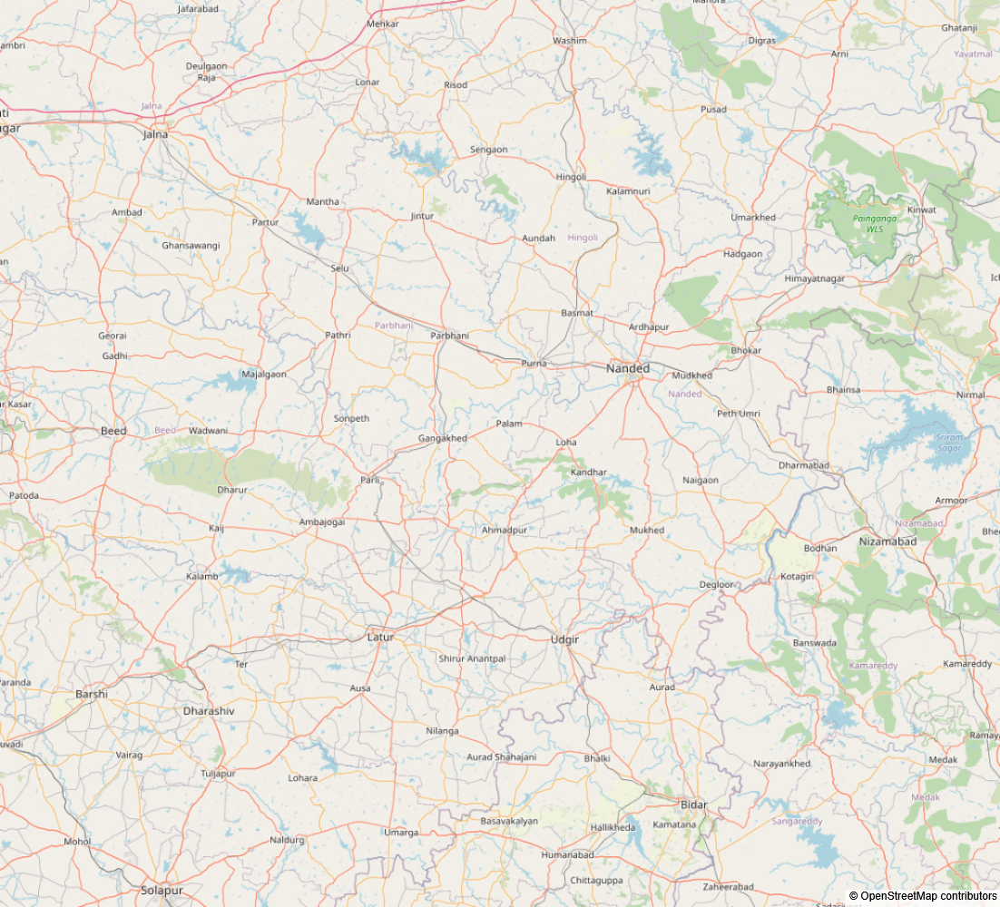

In [102]:
import plotly.express as px
data1 = df.copy()
data1.dropna(axis=0, how='any', inplace=True)
color_scale = [(0, 'orange'), (1,'red')]
fig = px.scatter_mapbox(data1, lat="Restaurant_latitude", lon= "Restaurant_longitude", color_continuous_scale= color_scale, zoom=8, height=1000, width=1000)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0, "t":0,"l":0, "b":0})
fig.show()


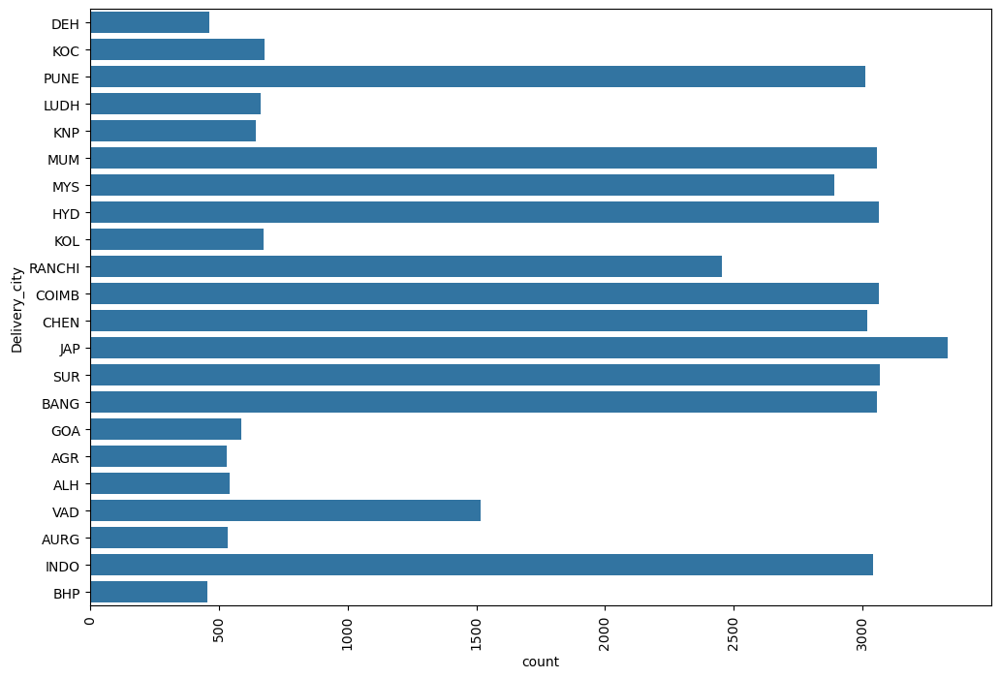

In [103]:
plt.figure(figsize=(12,8))
sns.countplot(df['Delivery_city'])
plt.xticks(rotation='vertical')
plt.show()

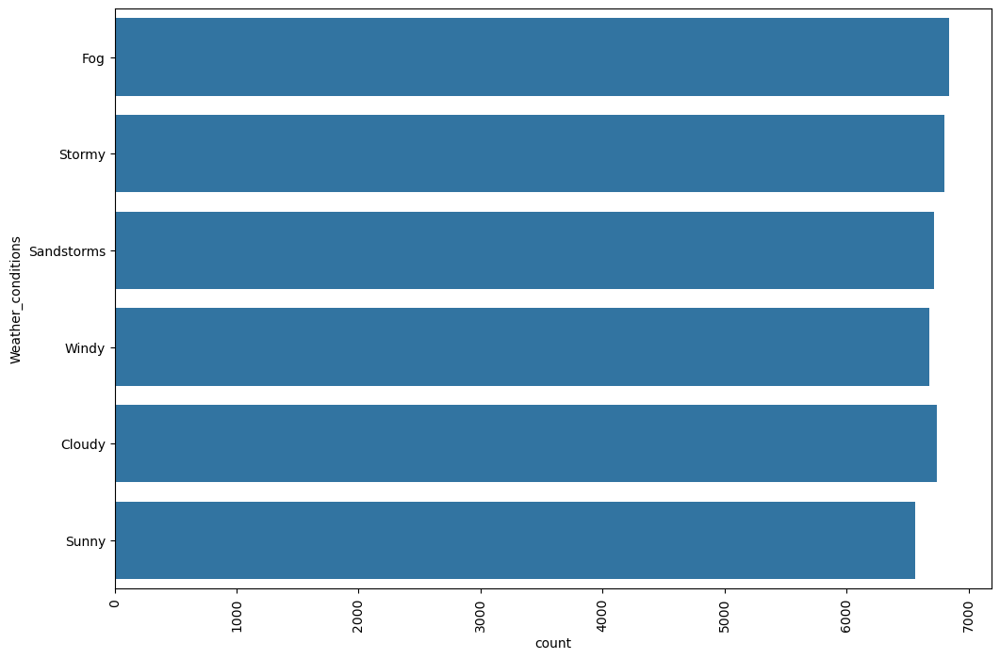

In [104]:
plt.figure(figsize=(12,8))
sns.countplot(df['Weather_conditions'])
plt.xticks(rotation='vertical')
plt.show()

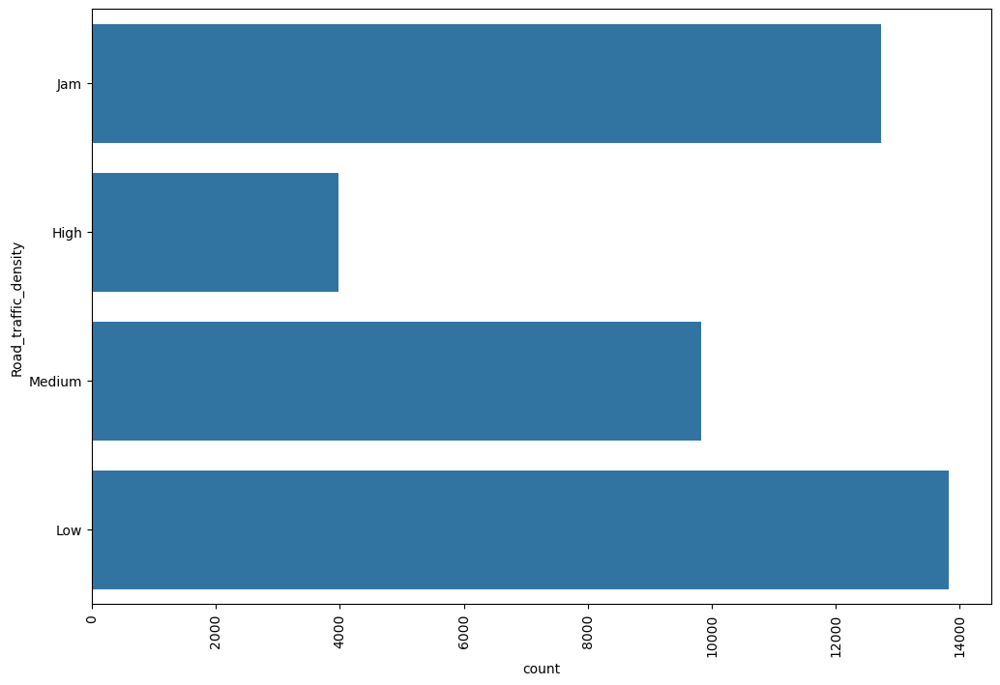

In [105]:
plt.figure(figsize=(12,8))
sns.countplot(df['Road_traffic_density'])
plt.xticks(rotation='vertical')
plt.show()

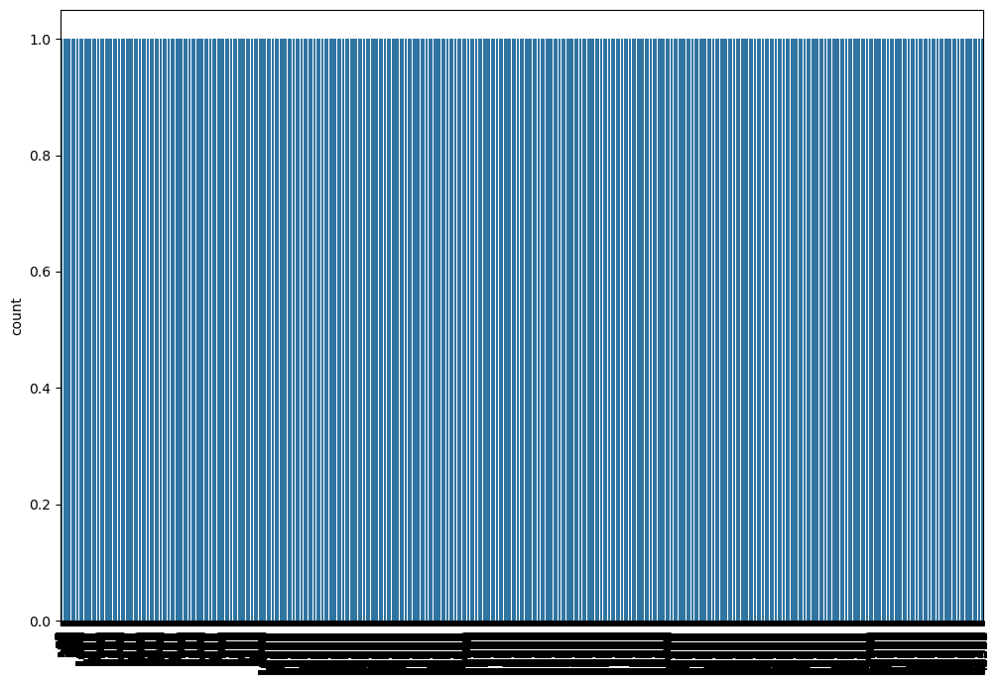

In [106]:
plt.figure(figsize=(12,8))
sns.countplot(df['Vehicle_condition'])
plt.xticks(rotation='vertical')
plt.show()

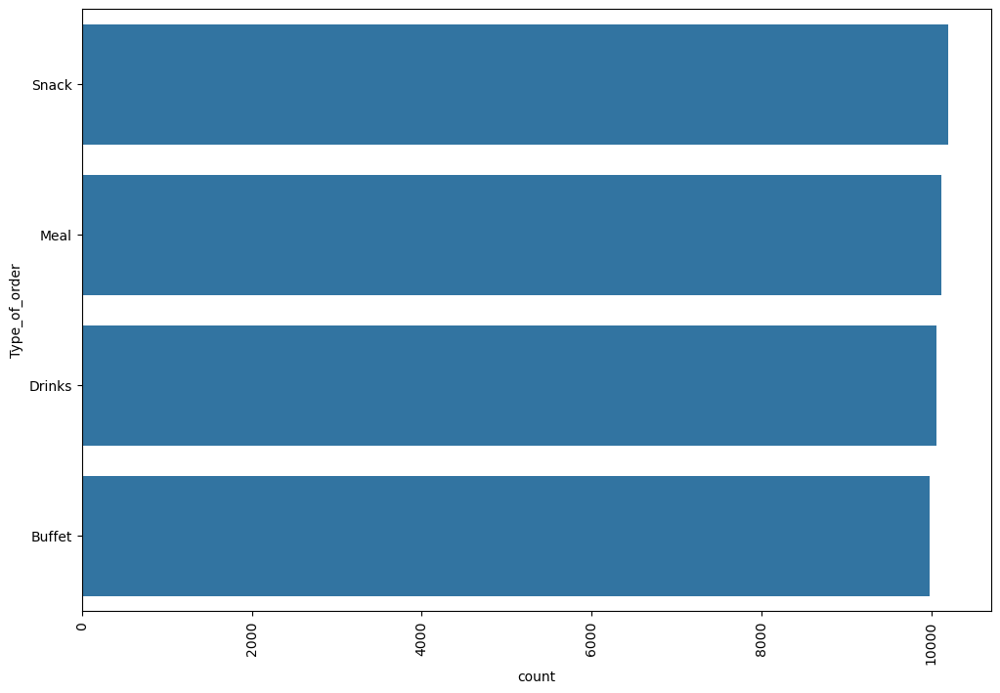

In [107]:
plt.figure(figsize=(12,8))
sns.countplot(df['Type_of_order'])
plt.xticks(rotation='vertical')
plt.show()

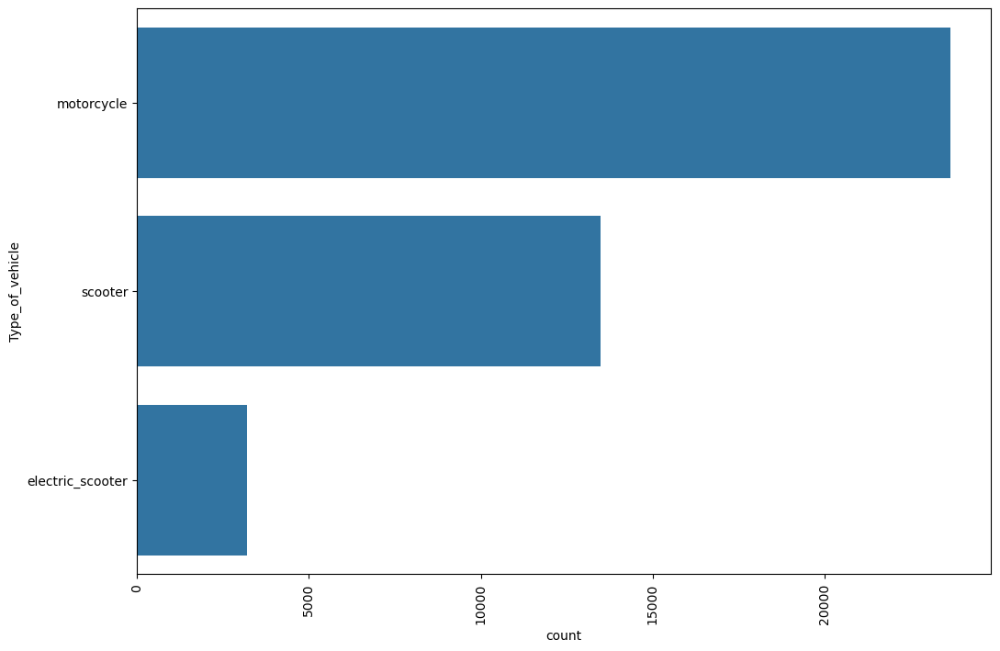

In [108]:
plt.figure(figsize=(12,8))
sns.countplot(df['Type_of_vehicle'])
plt.xticks(rotation='vertical')
plt.show()

In [109]:
#numerical_feature = [feature for feature in df.columns if df[feature].dtypes != 'O']
#numerical_feature

#### more graphs

In [110]:
df.isnull().sum()

Delivery_person_ID                0
Delivery_person_Age             200
Delivery_person_Ratings           0
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Time_Orderd                       0
Time_Order_picked                 0
Weather_conditions                0
Road_traffic_density              0
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             855
Festival                        206
City                           1059
Time_taken (min)                  0
year                              0
month                             0
day                               0
TimeOrder_Hour                    0
Time_Order_picked_Hour            0
Time_Order_picked_min             0
Delivery_city                     0
distance                          0
dtype: int64

In [111]:
df['multiple_deliveries'].dtypes

dtype('float64')

In [112]:
#df.drop('Delivery_person_ID', axis=1, inplace=True)

In [113]:
#df.drop(['Time_Orderd', 'Time_Order_picked' ] , axis=1, inplace=True)

In [114]:
df.columns

Index(['Delivery_person_ID', 'Delivery_person_Age', 'Delivery_person_Ratings',
       'Restaurant_latitude', 'Restaurant_longitude',
       'Delivery_location_latitude', 'Delivery_location_longitude',
       'Time_Orderd', 'Time_Order_picked', 'Weather_conditions',
       'Road_traffic_density', 'Vehicle_condition', 'Type_of_order',
       'Type_of_vehicle', 'multiple_deliveries', 'Festival', 'City',
       'Time_taken (min)', 'year', 'month', 'day', 'TimeOrder_Hour',
       'Time_Order_picked_Hour', 'Time_Order_picked_min', 'Delivery_city',
       'distance'],
      dtype='object')

In [115]:
df.head()

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_Orderd,Time_Order_picked,Weather_conditions,...,City,Time_taken (min),year,month,day,TimeOrder_Hour,Time_Order_picked_Hour,Time_Order_picked_min,Delivery_city,distance
0,DEHRES17DEL01,36.0,4.2,30.327968,78.046106,30.397968,78.116106,2155,22:10,Fog,...,Metropolitian,46,2022,2,12,2155,22,10,DEH,10.280582
1,KOCRES16DEL01,21.0,4.7,10.003064,76.307589,10.043064,76.347589,1455,15:05,Stormy,...,Metropolitian,23,2022,2,13,1455,15,5,KOC,6.242319
2,PUNERES13DEL03,23.0,4.7,18.562450,73.916619,18.652450,74.006619,1730,17:40,Sandstorms,...,Metropolitian,21,2022,3,4,1730,17,40,PUNE,13.787860
3,LUDHRES15DEL02,34.0,4.3,30.899584,75.809346,30.919584,75.829346,0920,09:30,Sandstorms,...,Metropolitian,20,2022,2,13,920,9,30,LUDH,2.930258
4,KNPRES14DEL02,24.0,4.7,26.463504,80.372929,26.593504,80.502929,1950,20:05,Fog,...,Metropolitian,41,2022,2,14,1950,20,5,KNP,19.396618


In [116]:
df.dtypes

Delivery_person_ID              object
Delivery_person_Age            float64
Delivery_person_Ratings        float64
Restaurant_latitude            float64
Restaurant_longitude           float64
Delivery_location_latitude     float64
Delivery_location_longitude    float64
Time_Orderd                     object
Time_Order_picked               object
Weather_conditions              object
Road_traffic_density            object
Vehicle_condition                int64
Type_of_order                   object
Type_of_vehicle                 object
multiple_deliveries            float64
Festival                        object
City                            object
Time_taken (min)                 int64
year                             int32
month                            int32
day                              int32
TimeOrder_Hour                   int32
Time_Order_picked_Hour           int32
Time_Order_picked_min            int32
Delivery_city                   object
distance                 

In [117]:
num_col = [ feature for feature in df.columns if df[feature].dtypes != 'O']
cat_col = [ feature for feature in df.columns if df[feature].dtypes == 'O']

In [118]:
num_col

['Delivery_person_Age',
 'Delivery_person_Ratings',
 'Restaurant_latitude',
 'Restaurant_longitude',
 'Delivery_location_latitude',
 'Delivery_location_longitude',
 'Vehicle_condition',
 'multiple_deliveries',
 'Time_taken (min)',
 'year',
 'month',
 'day',
 'TimeOrder_Hour',
 'Time_Order_picked_Hour',
 'Time_Order_picked_min',
 'distance']

In [119]:
cat_col

['Delivery_person_ID',
 'Time_Orderd',
 'Time_Order_picked',
 'Weather_conditions',
 'Road_traffic_density',
 'Type_of_order',
 'Type_of_vehicle',
 'Festival',
 'City',
 'Delivery_city']

In [120]:
df.sample()

,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_Orderd,Time_Order_picked,Weather_conditions,...,City,Time_taken (min),year,month,day,TimeOrder_Hour,Time_Order_picked_Hour,Time_Order_picked_min,Delivery_city,distance
31401,MYSRES20DEL01,22.0,4.6,12.337978,76.616792,12.407978,76.686792,2050,21:05,Fog,...,Metropolitian,30,2022,3,2,2050,21,5,MYS,10.880651


In [121]:
df.drop(['Restaurant_latitude','Restaurant_longitude',
 'Delivery_location_latitude', 'Delivery_location_longitude','year',
 'month',
 'day',
 'TimeOrder_min',
 'Time_Order_picked_Hour',
 'Time_Order_picked_min',], axis=1, inplace=True)

KeyError: "['TimeOrder_min'] not found in axis"

In [ ]:
df.head()

#### splitting into x and y

In [ ]:
X = df.drop(labels=['Time_taken (min)'],axis=1)
y = df[['Time_taken (min)']]

In [ ]:
df[cat_col].head()

In [ ]:
num_col = [feature for feature in df.columns if df[feature].dtypes !='O']

In [ ]:
df[num_col].head()

In [ ]:
df[df['Road_traffic_density'] == 'Low'] 

In [ ]:
Road_traffic_density = ['Low','Medium','High','Jam']
Weather_conditions = ['Sunny', 'Cloudy', 'Windy', 'Fog', 'Sandstorms', 'Stormy']


In [ ]:
categorical_column = ['Type_of_order', 'Type_of_vehicle', 'Festival', 'City', 'Delivery_city']
ordinal_encod = ['Road_traffic_density', 'Weather_conditions']
numerical_column = ['Delivery_person_Age', 'Delivery_person_Ratings', 'Vehicle_condition', 'multiple_deliveries', 'TimeOrder_Hour', 'distance']

In [ ]:
numerical_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='constant', fill_value=0)),
    ('scaler', StandardScaler ( with_mean=False))
])

categorical_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder (handle_unknown='ignore')),
    ('scaler',StandardScaler ( with_mean=False))
])

ordinal_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('ordinal', OrdinalEncoder (categories=[Road_traffic_density,Weather_conditions])),
    ('scaler',StandardScaler ( with_mean=False))
])

In [ ]:
preprocessor = ColumnTransformer([
    ('numerical_pipeline', numerical_pipeline, numerical_column),
    ('categorical_pipeline', categorical_pipeline, categorical_column),
    ('ordinal_pipeline', ordinal_pipeline, ordinal_encod)
    
])

In [ ]:
X_train , X_test, y_train, y_test = train_test_split(X,y, test_size=0.20, random_state = 42)

In [ ]:
X_train = preprocessor.fit_transform(X_train)

In [ ]:
X_test = preprocessor.transform(X_test)

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso,Ridge,ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

from sklearn.metrics import r2_score , mean_absolute_error, mean_squared_error

In [ ]:
def evaluate_reg(true, predicted):
    r2 = r2_score(true, predicted)
    MAE = mean_absolute_error(true, predicted)
    MSE = mean_squared_error(true, predicted)
    rmse = np.sqrt(mean_squared_error(true,predicted))

    return r2, MAE, MSE, rmse

In [ ]:
models = {
    "Random Forest": RandomForestRegressor(),
    "Decision Tree": DecisionTreeRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "linear Regression": LinearRegression(),
    "Ridge": Ridge(),
    "XGBRegressor": XGBRegressor(),
    
}

r2_list = []
mse_list=[]
models_list = []

for i in range (len(list(models))):
    model = list(models.values())[i]
    model.fit(X_train, y_train)

    #make prediction
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    #test set performance
    r2,MAE,MSE,rmse = evaluate_reg(y_test, y_test_pred)
    r2_train, MAE_train, MSE_train, rmse_train = evaluate_reg(y_train, y_train_pred)

    print(list(models.keys())[i])
    models_list.append(list(models.keys())[i])

    print('Model performance for Test set')
    print('r2_score: :.4f'.format(r2))
    print( 'MSE: (:.4f)'.format(MSE))
    print(' MAE: (:.4f)'.format(MAE)) 
    print('rmse: {:.4f}'.format(rmse))
    r2_list.append(r2)
    mse_list.append(MSE)
    print('-'*35)

    print('Model performance for train set')
    print('r2_score: (:.4f)'.format(r2_train)) 
    print('MAE: (:.4f)'.format(MAE_train)) 
    print( 'MSE: (:.4f)'.format(MSE_train)) 
    print('rmse: (:.4f'.format(rmse_train))
    print('='*35)
    print('='*35)
    print('\n')
    

In [ ]:
Results = pd.DataFrame(list(zip(models_list,r2_list)), columns=['Model Name', 'r2_score'])
Results.sort_values(by=["r2_score"],ascending = False)

In [ ]:
Results = pd.DataFrame(list(zip(models_list,mse_list)), columns=['Model Name', 'Mse'])
Results.sort_values(by=["Mse"],ascending = False)